<a href="https://colab.research.google.com/github/arizonaCameraLab/computationalImaging/blob/master/Chapter9DigitalImaging/slantedEdgeMTFAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Slanted Edge MTF Measurement

## David Brady
## University of Arizona
## Spring 2023

This notebook uses slanted edge images to analyze the MTF for a Samsung note20 Ultra smart phone. The listed camera specifications are as follows

108 MP, f/1.8, 26mm (wide), 1/1.33", 0.8µm, PDAF, Laser AF, OIS

12 MP, f/3.0, 120mm (periscope telephoto), 1.0µm, PDAF, OIS, 5x optical zoom, 50x hybrid zoom

12 MP, f/2.2, 120˚, 13mm (ultrawide), 1/2.55", 1.4µm

These specifications are in marketing speak, the focal lengths listed are 35 mm equivalent. The actual focal lengths are 2.2 mm for the ultrawide, 7 mm for the wide and 14.2 mm for the telephoto.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from scipy.special import erf
from google.colab import files
from scipy.interpolate import interp1d, Akima1DInterpolator, UnivariateSpline
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})


In [2]:
!pip install rawpy
import rawpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 16.3 MB/s eta 0:00:00


## telephoto lens

We consider below  a photo taken with a samsung S20 Ultra telephoto lens.

samsung SM-N986U1
ƒ/3
1/30
14.2mm
ISO32
1 micron pixel size

In [3]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/14p2mm.dng'

--2025-03-25 00:35:24--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/14p2mm.dng
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/14p2mm.dng [following]
--2025-03-25 00:35:25--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/14p2mm.dng
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24141312 (23M) [application/octet-stream]
Saving to: ‘14p2mm.dng’

14p2mm.dng          100%[===================>]  23.02M  39.7MB/s    in 0.6s    

202

In [83]:
raw = rawpy.imread('14p2mm.dng')
rawImage=raw.raw_image_visible

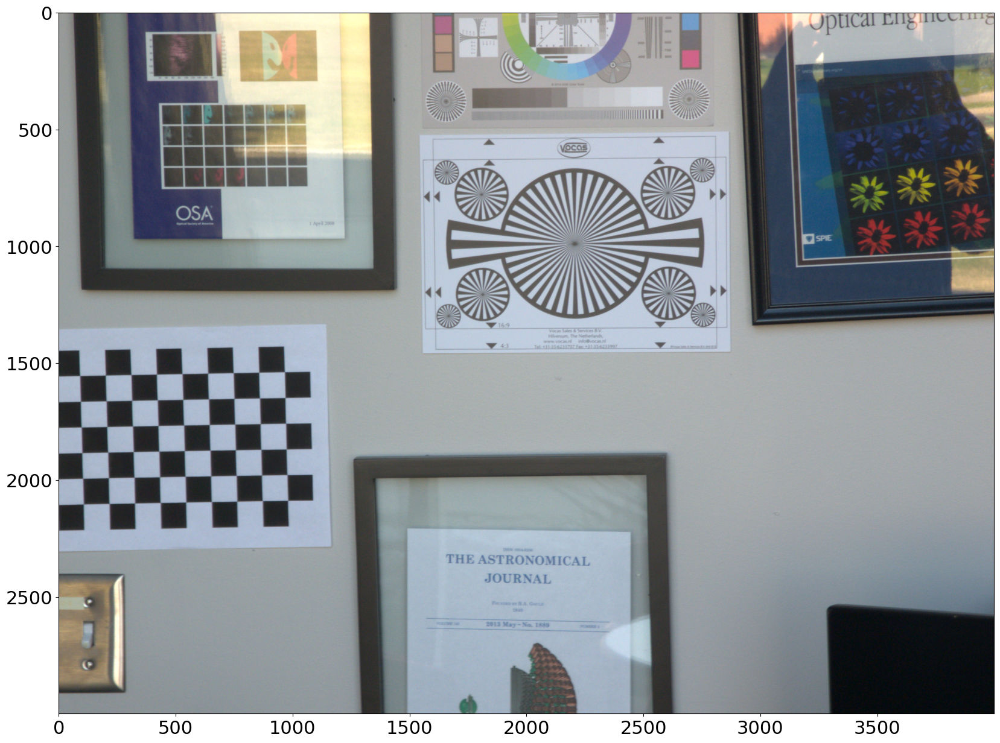

In [ ]:
plt.imshow(raw.postprocess())

In [ ]:
rawImage.shape

(3000, 4000)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

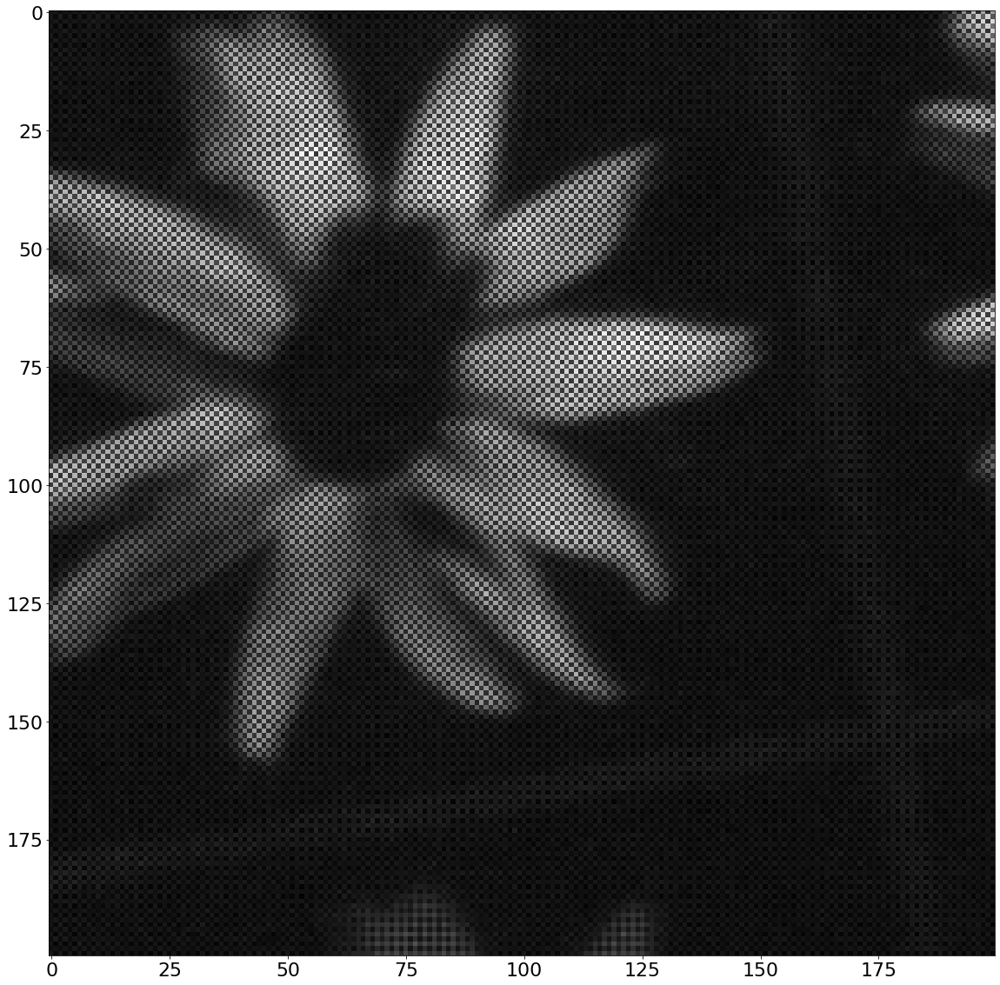

In [ ]:
plt.imshow(rawImage[700:900,3400:3600],cmap='gray')
plt.axis('image')
plt.savefig('samsungTele.pdf')
#files.download('samsungTele.pdf')

we break the image into its RGB components with the following code. The green images should look the same, look for red and blue features in the original image to identify the corresponding channels.

In [86]:
b=rawImage[0:3000:2,0:4000:2]
r=rawImage[1:3000:2,1:4000:2]
g1=rawImage[1:3000:2,0:4000:2]
g2=rawImage[0:3000:2,1:4000:2]

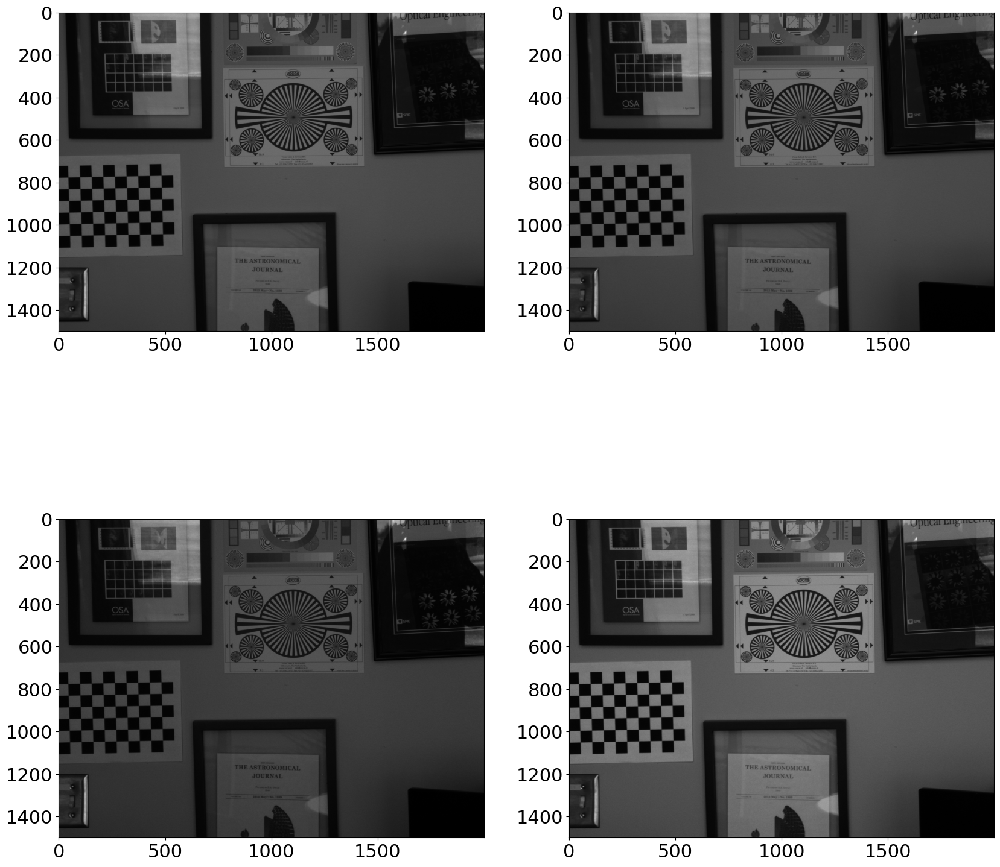

In [10]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")
plt.savefig('samsungTeleRGGB.pdf')
#files.download('samsungTeleRGGB.pdf')

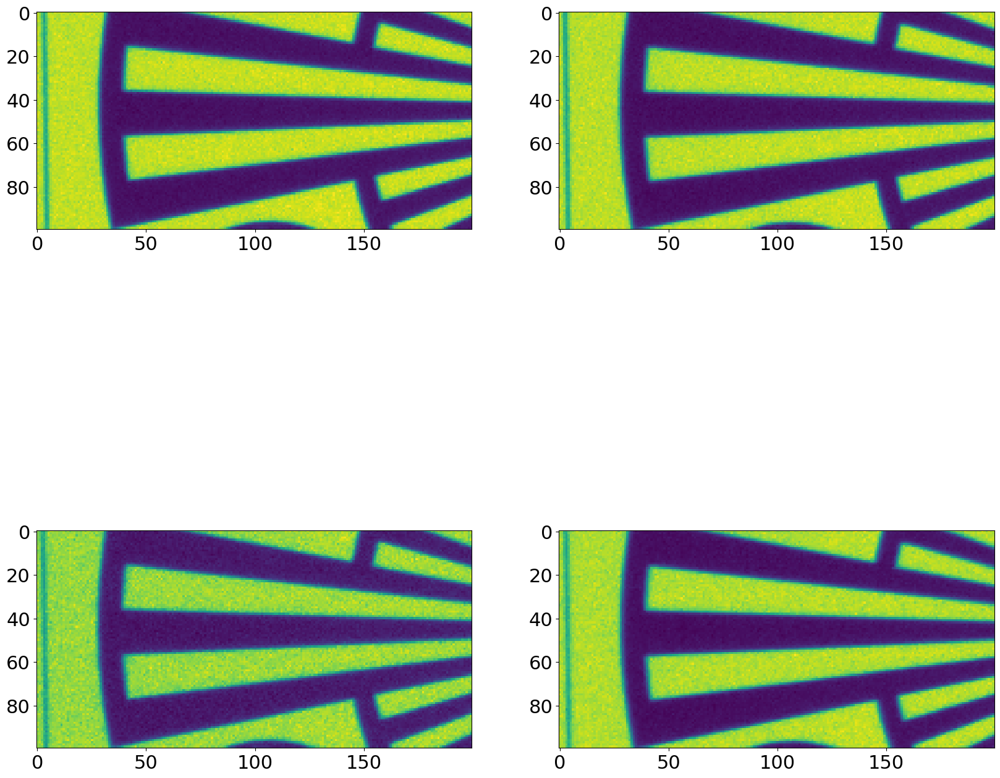

In [7]:
plt.subplot(2,2,1)
plt.imshow(g1[450:550,800:1000])
plt.subplot(2,2,2)
plt.imshow(g2[450:550,800:1000])
plt.subplot(2,2,3)
plt.imshow(r[450:550,800:1000])
plt.subplot(2,2,4)
plt.imshow(b[450:550,800:1000])

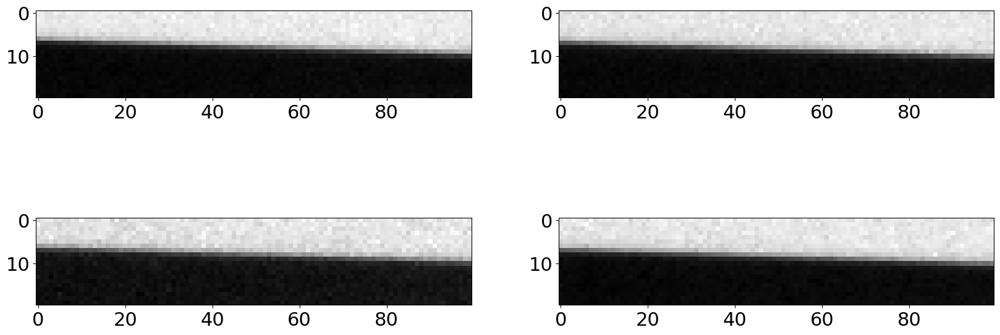

In [87]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[480:500,850:950]
g2c=g2[480:500,850:950]
rc=r[480:500,850:950]
bc=b[480:500,850:950]
plt.subplot(2,2,1)
plt.imshow(g1c,cmap='gray')
plt.subplot(2,2,2)
plt.imshow(g2c,cmap='gray')
plt.subplot(2,2,3)
plt.imshow(rc,cmap='gray')
plt.subplot(2,2,4)
plt.imshow(bc, cmap='gray')
plt.savefig('samsungTeleEdge.pdf')
#files.download('samsungTeleEdge.pdf')

We can find the position in the edge in each column by looking at where the gradient is across the edge is minimal. Argmin finds the position of the minimum.

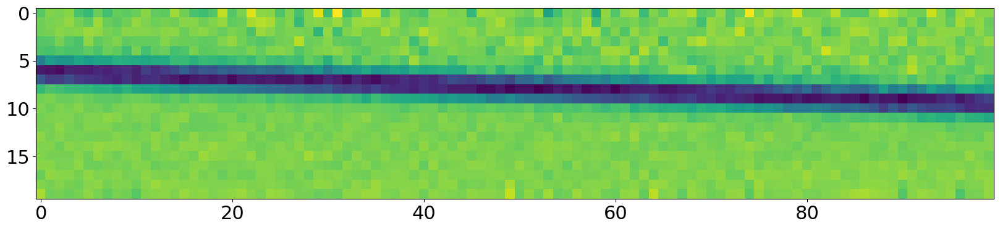

In [ ]:
plt.imshow(np.gradient(g1c, axis=0))

To find the relative displacement of the edge between rows we need to find the slope of the edge, which we do here.

mean slope = 0.03398739873987399


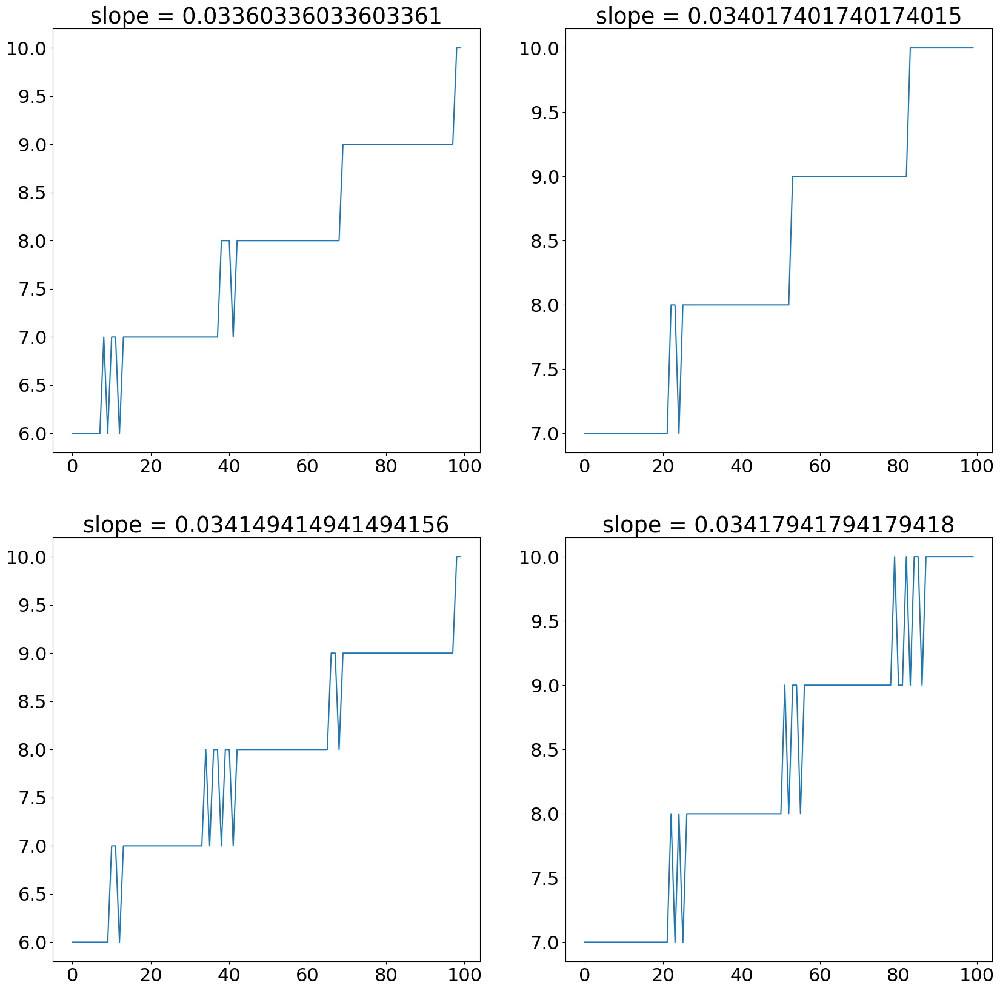

In [88]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2c, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(rc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(bc, axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

If we plot data along a single column we only have a couple of data points within the edge region.

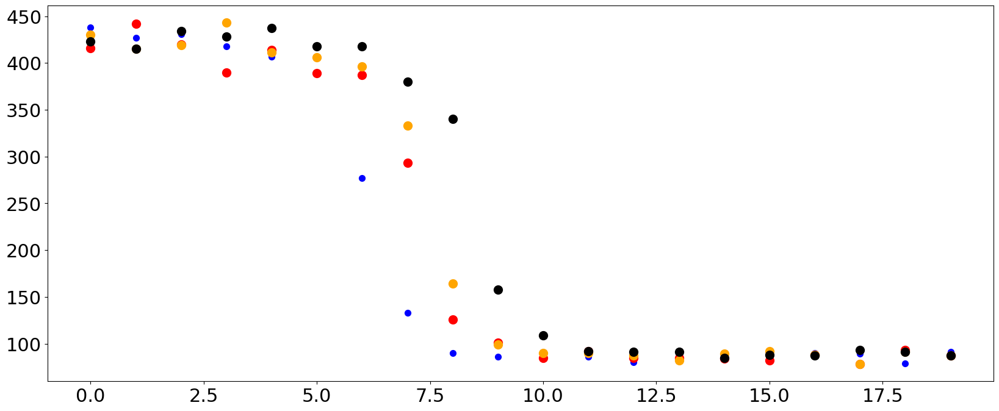

In [ ]:
plt.scatter(np.arange(20),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(20),g1c[:,29], s=100,c='red')
plt.scatter( np.arange(20),g1c[:,40], s=100,c='orange')
plt.scatter( np.arange(20),g1c[:,70], s=100,c='black')


shifting the edge points according to the slope of the edge and combining data from multiple columns, we can densely sample the edge region. The function describing the edge is the edge shape function.

In [98]:
points=np.zeros((np.size(g2c),2))
for pop in np.arange(g2c.shape[0]):
  for pip in np.arange(g2c.shape[1]):
    points[pop*g2c.shape[1]+pip,:]=(pop-slope*pip,g2c[pop,pip])
points=points[points[:,0].argsort(),:]


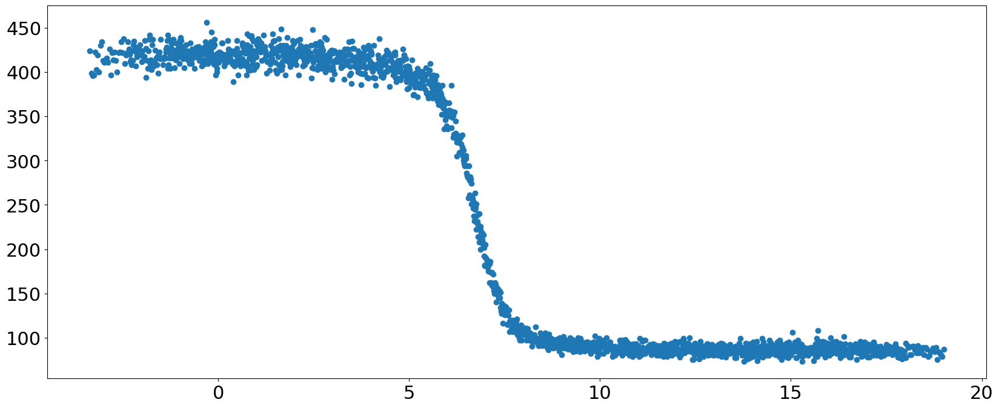

In [90]:
plt.scatter(points[:,0],points[:,1])

We choose to model the edge as an erf function and find the best fit parameters to the erf.

In [91]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

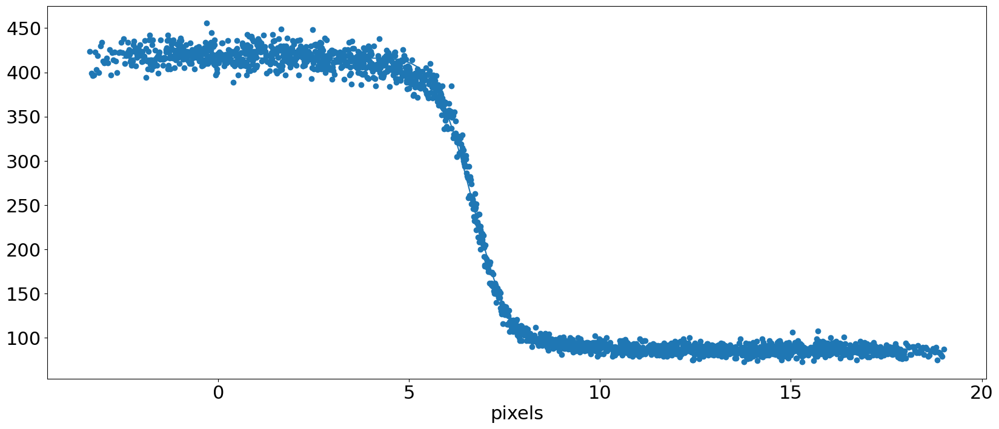

In [96]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

The ERF function has the form
$$
{\rm erf}(x)=\frac{2}{\sqrt{\pi}}\int_0^x e^{-y^2}dy
$$
such that
$$
\frac{d}{dx}{\rm erf}(x)=\frac{2}{\sqrt{\pi}}e^{-x^2}
$$

In our parameter fit of the edge, we are not concerned with the position or height, we are only concerned with the width, $\sigma$, which defines the width of the transition. Here our **line shape function**, e.g. the derivative of the edge shape function, accounting for the fact that the pixel spacing for each color channel is 2 microns, looks like this

Text(0.5, 0, 'microns')

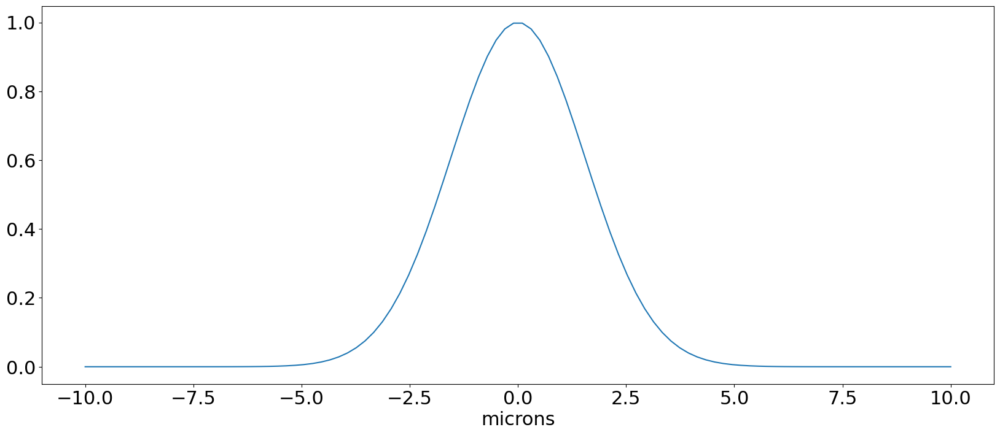

In [97]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(2*params[2]))**2))
plt.xlabel('microns')

In [93]:
params

array([-164.35899533,    6.66920599,    1.09761939,  251.84478173])

In [99]:
var14=params[2]

The optical transfer function is obtained by taking the Fourier transform of $s(x)∝e^{-\frac{x^2}{\sigma^2}}$, which is
$$
H(u)= e^{-\pi^2 \sigma^2u^2}
$$
In the curve fitting, $\sigma $ is in units of pixels, to convert to microns we multiply by the pixel spacing for the green channel, 2 microns.

Text(0, 0.5, 'mtf')

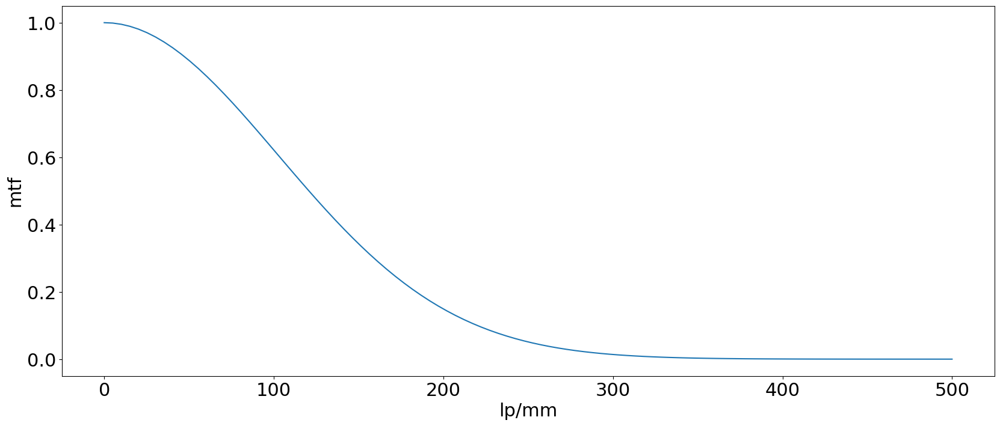

In [95]:
plt.plot(1000*np.linspace(0,.5,100), np.exp(-(np.pi**2)*(4.*var**2)*np.linspace(0,.5,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [100]:
sfrData=np.array([[0,1],[50.25,0.892],[100.5,.657],[150,.425],[201,.304],[251,.253],[301,.188],[351,.067],[402,.037]])

Text(0, 0.5, 'mtf')

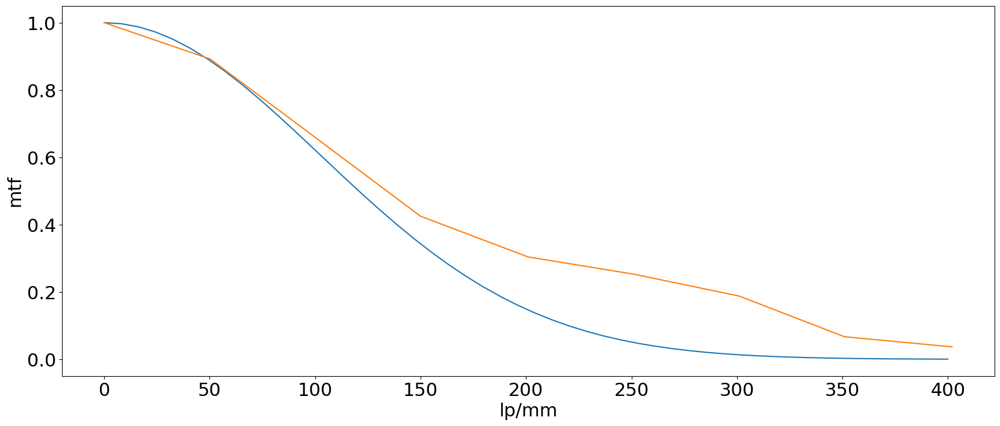

In [101]:
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(4*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

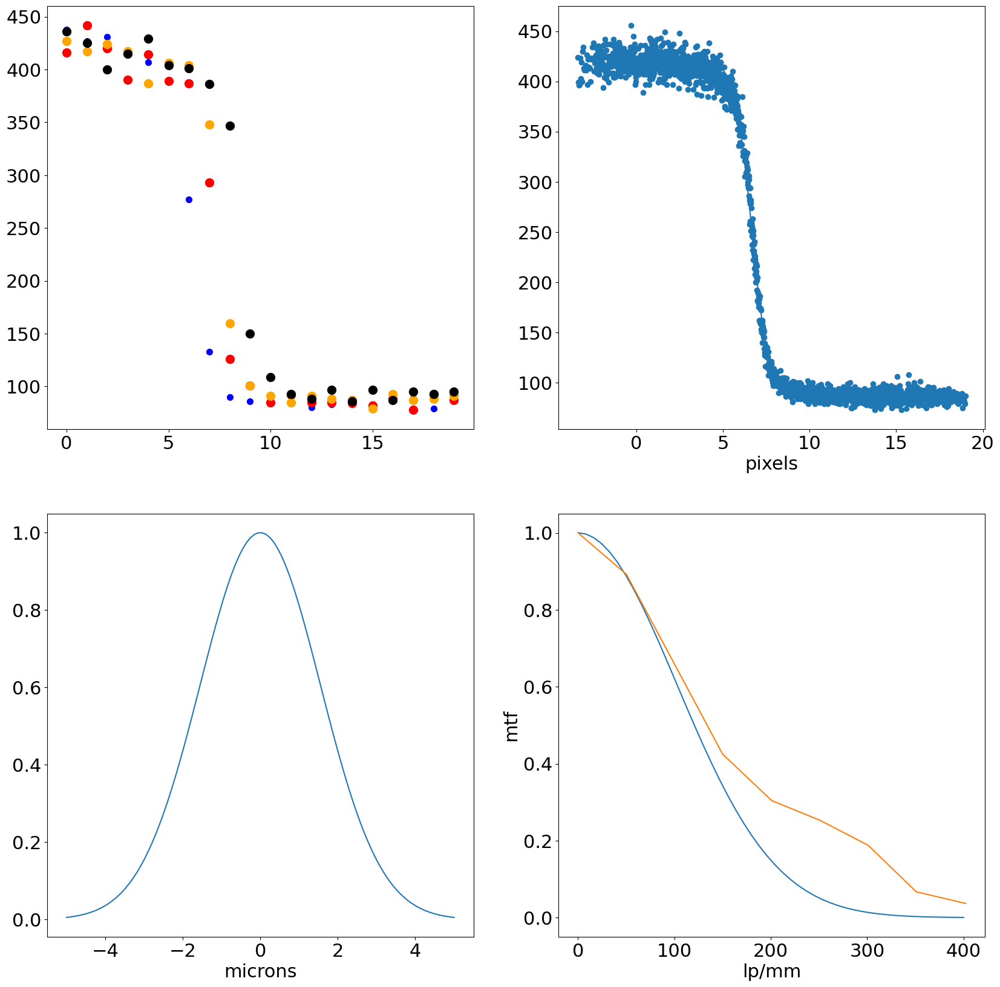

In [102]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.scatter(np.arange(20),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(20),g1c[:,29], s=100,c='red')
plt.scatter( np.arange(20),g1c[:,39], s=100,c='orange')
plt.scatter( np.arange(20),g1c[:,69], s=100,c='black')
plt.subplot(2,2,2)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')
plt.subplot(2,2,3)
x=np.linspace(-5,5,100)
plt.plot(x, np.exp(-(x/(2*params[2]))**2))
plt.xlabel('microns')
plt.subplot(2,2,4)
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(4*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')
plt.savefig('samsungTeleMTF.pdf')
files.download('samsungTeleMTF.pdf')

## Analysis of Samsung S23 Ultra and Samsung S6 Lite tablet cameras

S23 ultra wide field camera 1.4 micron pixels
A6 tab 1.12 micron pixels


In [26]:
!wget --no-check-certificate --content-disposition https://arizona.box.com/shared/static/345723cpd953uwn2qi5pgrk0l0z2nbqe
!unzip slantedEdge.zip

--2025-03-25 00:58:38--  https://arizona.box.com/shared/static/345723cpd953uwn2qi5pgrk0l0z2nbqe
Resolving arizona.box.com (arizona.box.com)... 74.112.186.157, 2620:117:bff0:12d::
Connecting to arizona.box.com (arizona.box.com)|74.112.186.157|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/345723cpd953uwn2qi5pgrk0l0z2nbqe [following]
--2025-03-25 00:58:39--  https://arizona.box.com/public/static/345723cpd953uwn2qi5pgrk0l0z2nbqe
Reusing existing connection to arizona.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://arizona.app.box.com/public/static/345723cpd953uwn2qi5pgrk0l0z2nbqe [following]
--2025-03-25 00:58:39--  https://arizona.app.box.com/public/static/345723cpd953uwn2qi5pgrk0l0z2nbqe
Resolving arizona.app.box.com (arizona.app.box.com)... 74.112.186.157, 2620:117:bff0:12d::
Connecting to arizona.app.box.com (arizona.app.box.com)|74.112.186.157|:443... connected.
HTTP request sent, 

In [103]:
rawS23 = rawpy.imread('slantedEdge/s23White.dng')
rawImageS23=rawS23.raw_image_visible


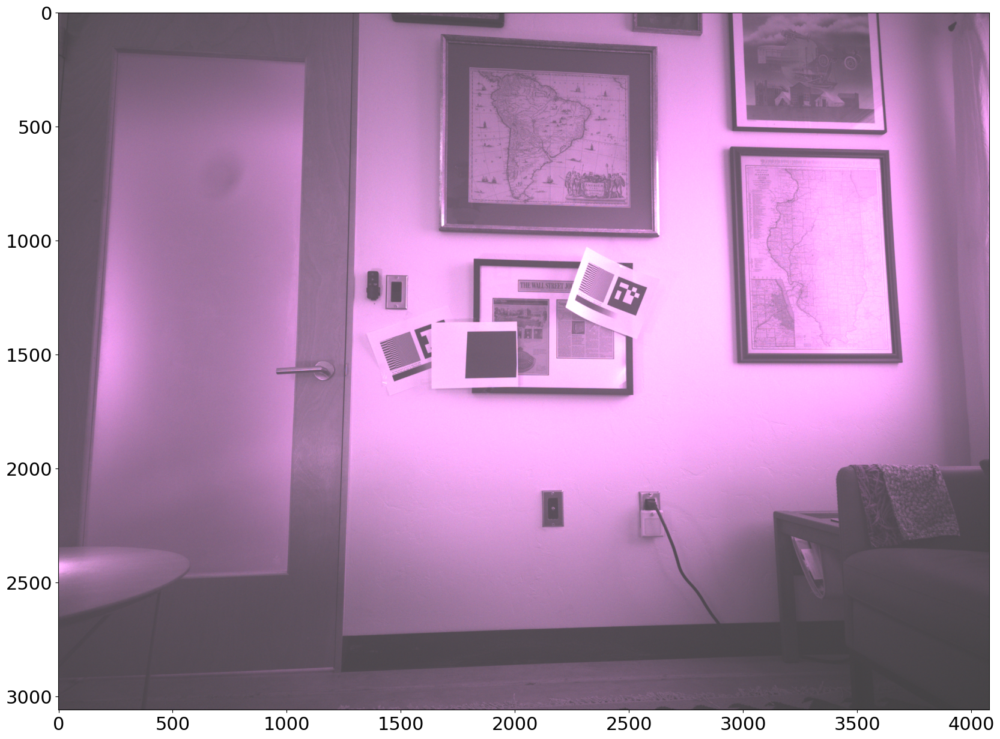

In [ ]:
# prompt: convert rawImageS23 from bayer data to rgb using opencv and display the rgb image

rgb_image = cv2.cvtColor(rawImageS23, cv2.COLOR_BayerBG2RGB)

# Display the RGB image
plt.imshow(rgb_image)
plt.show()


In [104]:
g1=rawImageS23[0:3000:2,0:4000:2]
g2=rawImageS23[1:3000:2,1:4000:2]
r=rawImageS23[1:3000:2,0:4000:2]
b=rawImageS23[0:3000:2,1:4000:2]

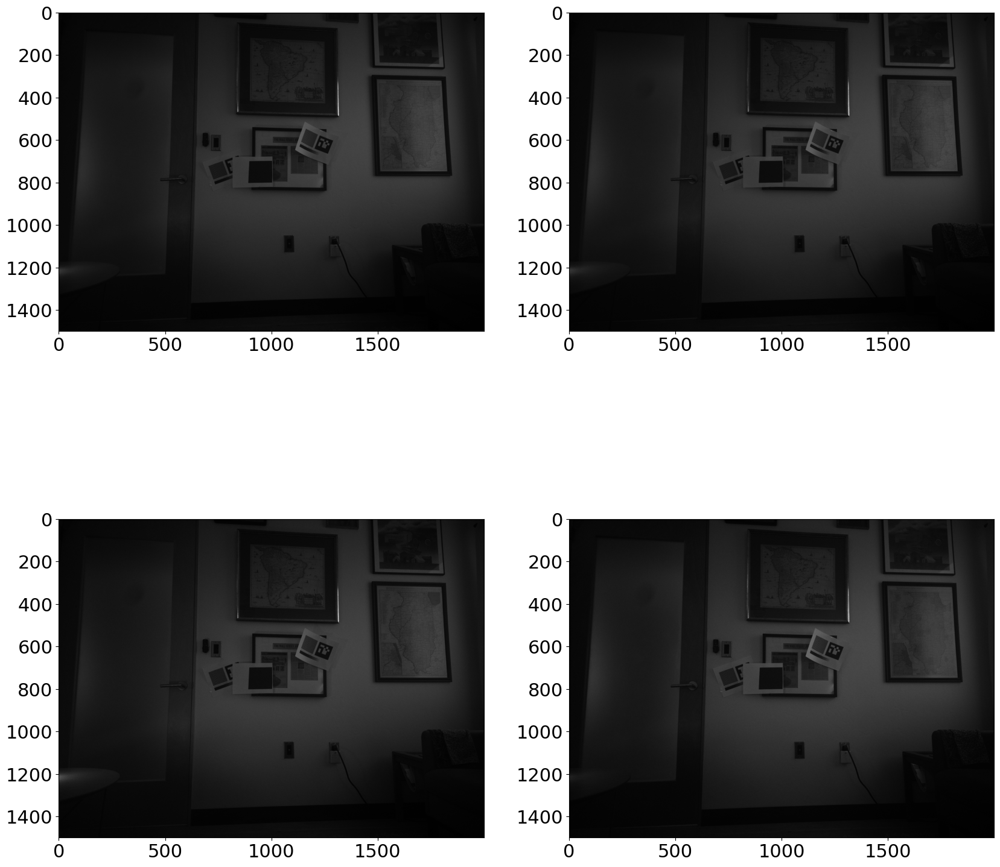

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")

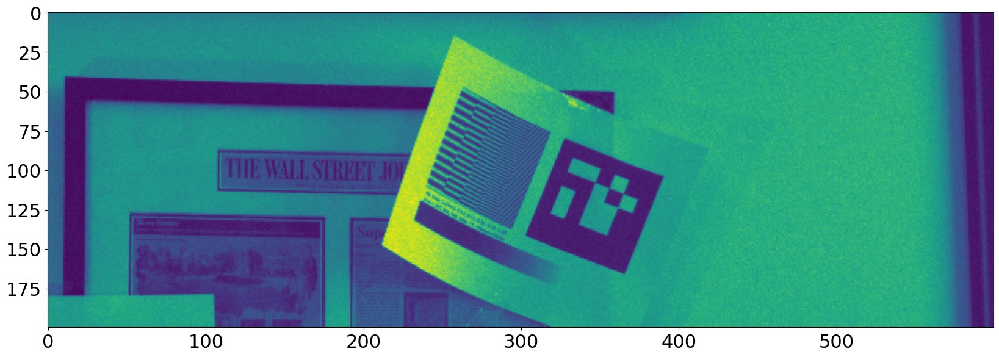

In [ ]:
plt.imshow(g1[500:700,900:1500])

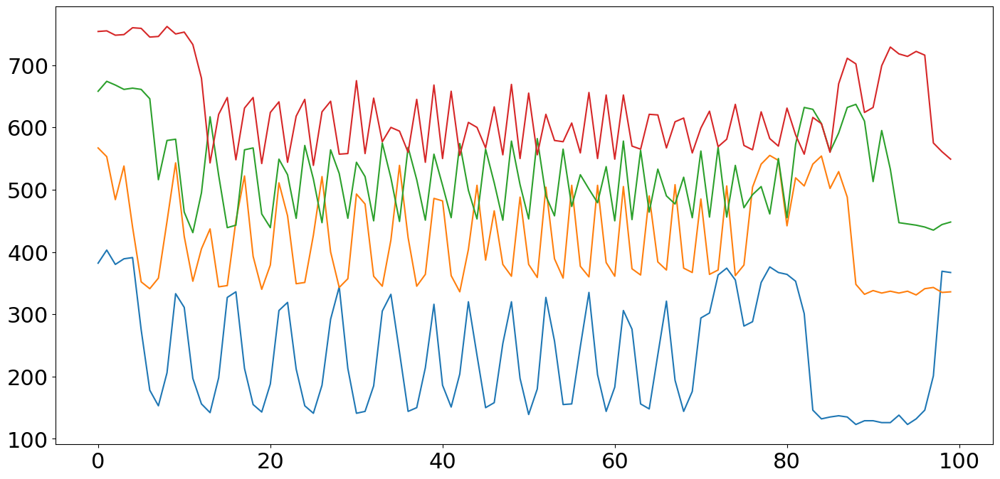

In [ ]:
plt.figure(figsize=(17,8))
plt.plot(g1[550:650,1160])
plt.plot(g1[550:650,1170]+200)
plt.plot(g1[550:650,1180]+300)
plt.plot(g1[550:650,1190]+400)

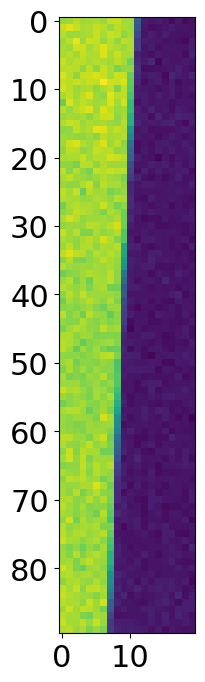

In [105]:
g1c=g1[710:800,885:905]
plt.imshow(g1c)


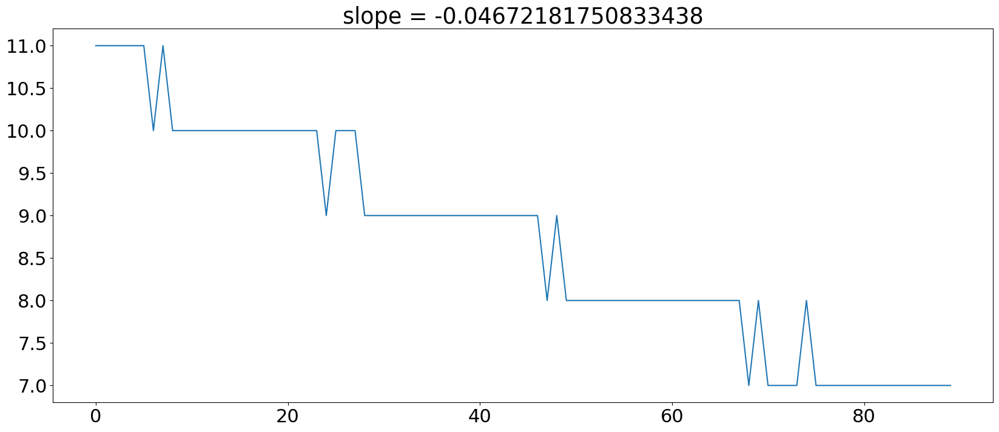

In [106]:
y=np.argmin(np.gradient(g1c, axis=1),axis=1)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope

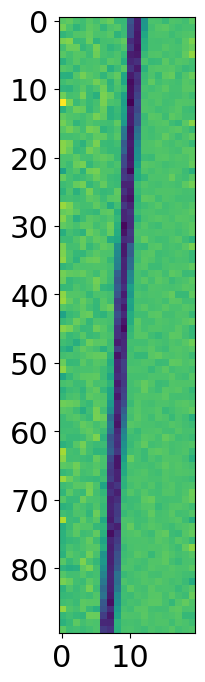

In [107]:

plt.imshow(np.gradient(g1c, axis=1))

In [108]:
points=np.zeros((np.size(g1c),2))
for pop in np.arange(g1c.shape[1]):
  for pip in np.arange(g1c.shape[0]):
    points[pop*g1c.shape[0]+pip,:]=(pop-slope*pip,g1c[pip,pop])
points=points[points[:,0].argsort(),:]

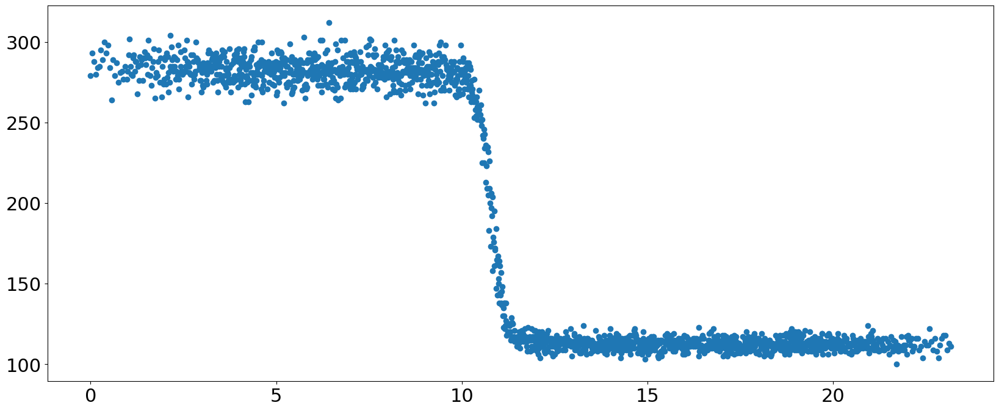

In [33]:
plt.scatter(points[:,0],points[:,1])

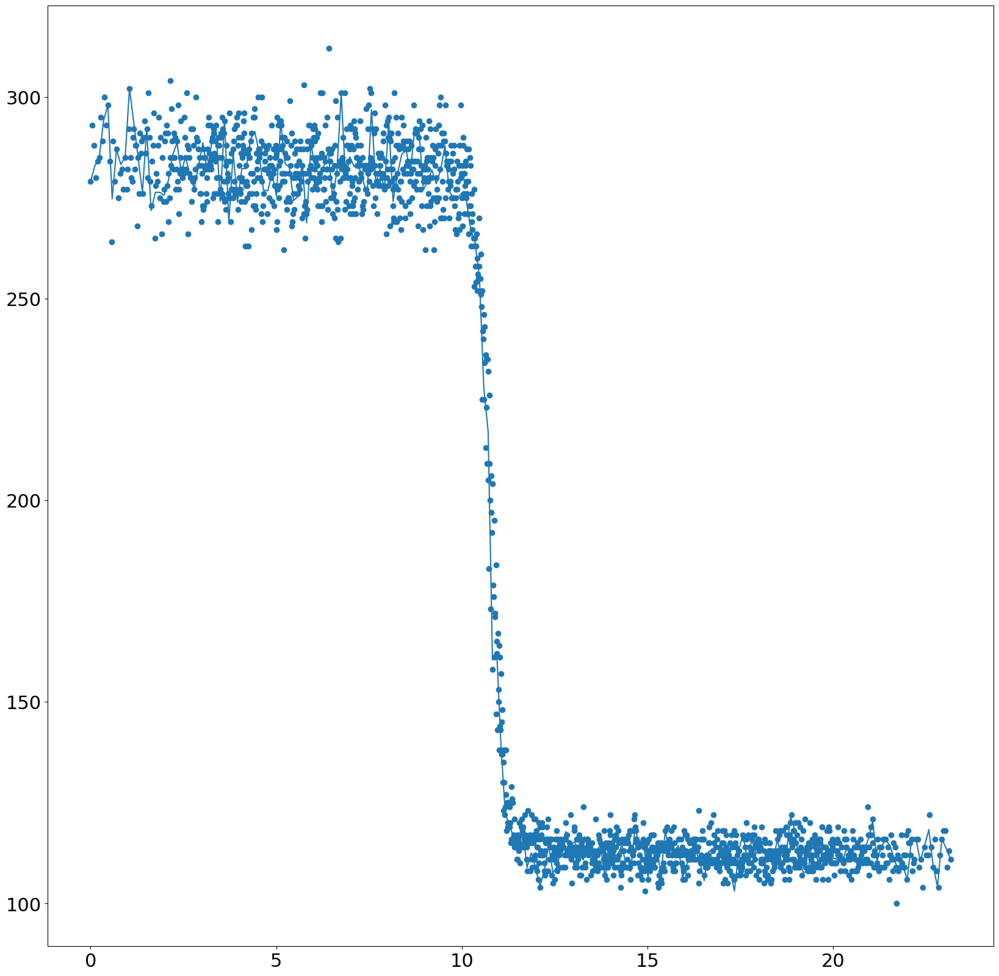

In [ ]:
plt.scatter(points[:,0],points[:,1])
x_new = np.linspace(points[0,0], points[-1,0], 200)
#akima = Akima1DInterpolator(points[:,0],points[:,1], method='makima')
#plt.plot(x_new,akima(x_new))
spline = UnivariateSpline(points[:,0],points[:,1], s=30.0)
plt.plot(x_new,spline(x_new))


In [109]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

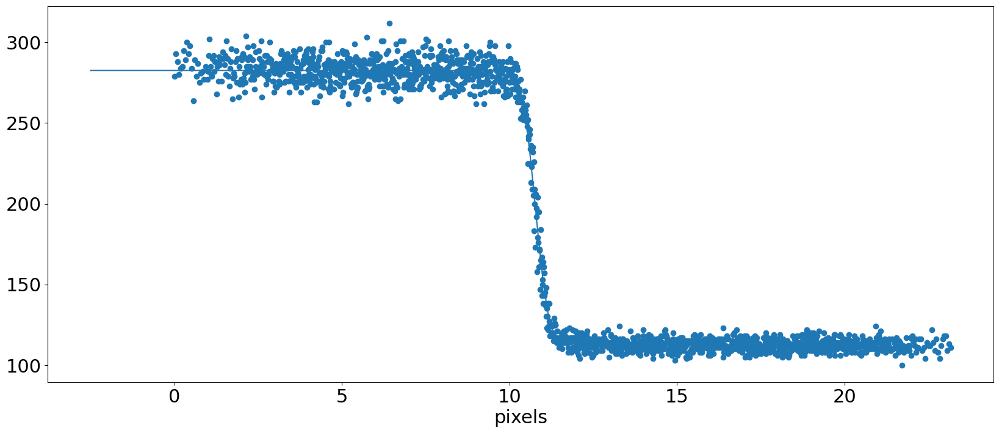

In [110]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

In [125]:
params

array([-85.00960788,  10.77283745,   0.44248273, 197.62037854])

a factor of 2.8 is added to the width variance below to account for the 1.4 micron pixel size and that we have sampled only one color channel, which has sampling pitch of 2.8 microns.

Text(0, 0.5, 'mtf')

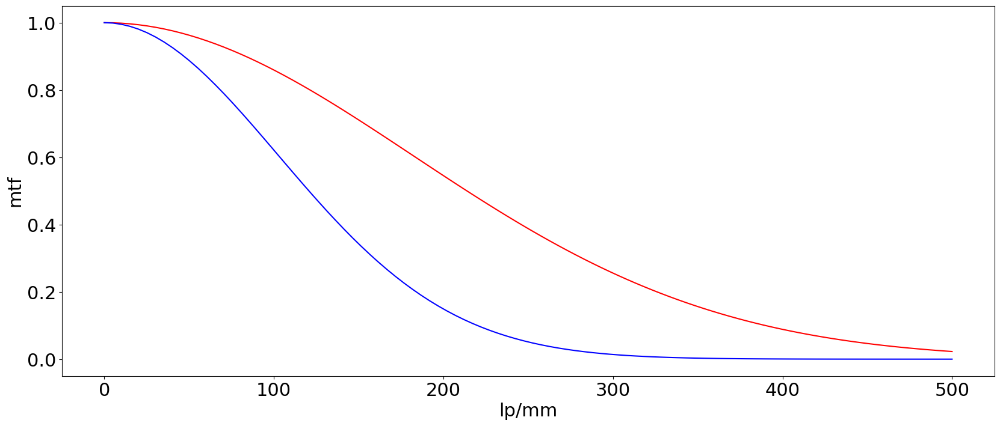

In [111]:
vars23=params[2]
plt.plot(1000*np.linspace(0,.5,100), np.exp(-(np.pi**2)*((2.8**2)*vars23**2)*np.linspace(0,.5,100)**2),'r')
plt.plot(1000*np.linspace(0,.5,100), np.exp(-(np.pi**2)*(4.*var**2)*np.linspace(0,.5,100)**2),'b')
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [61]:
rawA6 = rawpy.imread('slantedEdge/a6White.dng')
rawImageA6=rawA6.raw_image_visible

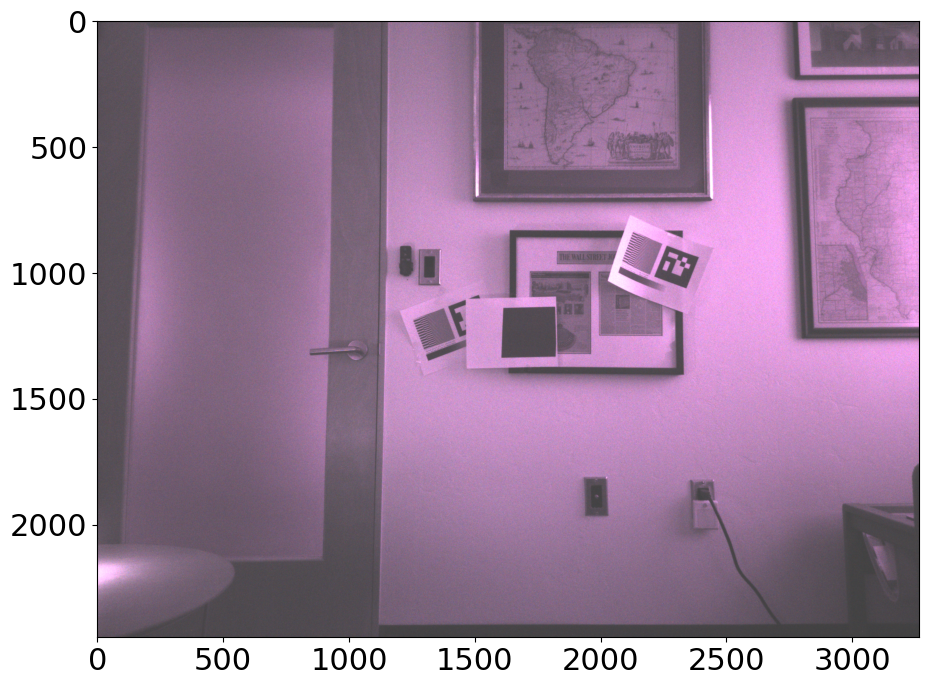

In [112]:
# prompt: convert rawImageS23 from bayer data to rgb using opencv and display the rgb image

rgb_image = cv2.cvtColor(rawImageA6, cv2.COLOR_BayerBG2RGB)

# Display the RGB image
plt.imshow(rgb_image)
plt.show()

In [ ]:
rawImageA6.shape

(2448, 3264)

In [113]:
g1=rawImageA6[0:2448:2,0:3264:2]
g2=rawImageA6[0:2448:2,0:3264:2]
r=rawImageA6[0:2448:2,0:3264:2]
b=rawImageA6[0:2448:2,0:3264:2]

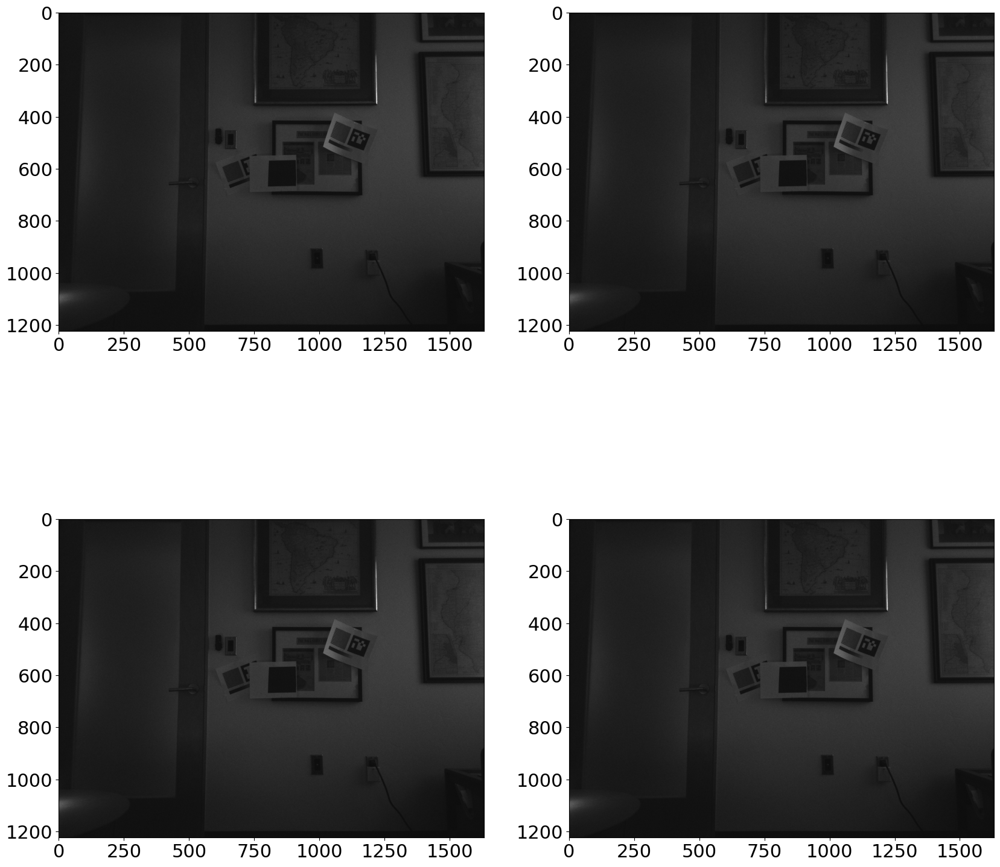

In [63]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1,cmap="gray")
plt.subplot(2,2,2)
plt.imshow(g2,cmap="gray")
plt.subplot(2,2,3)
plt.imshow(r,cmap="gray")
plt.subplot(2,2,4)
plt.imshow(b,cmap="gray")

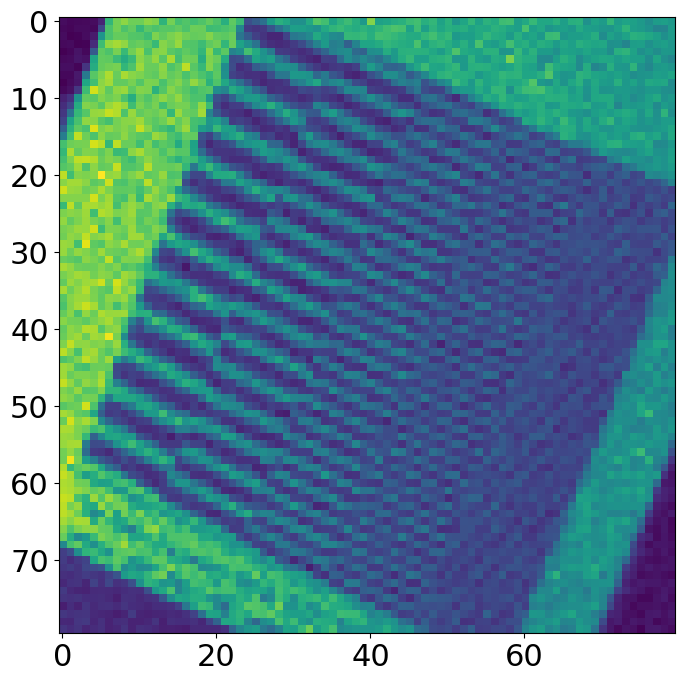

In [67]:
plt.imshow(g1[420:500,1040:1120])

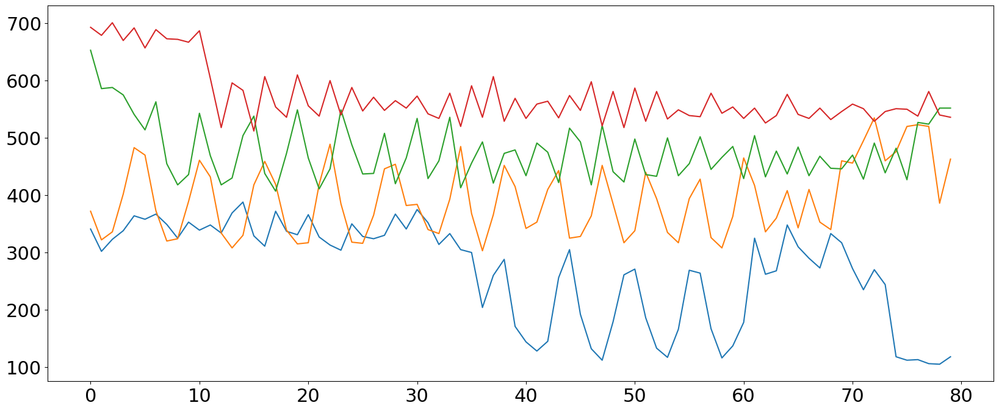

In [69]:
plt.plot(g1[420:500,1050])
plt.plot(g1[420:500,1065]+200)
plt.plot(g1[420:500,1080]+300)
plt.plot(g1[420:500,1095]+400)

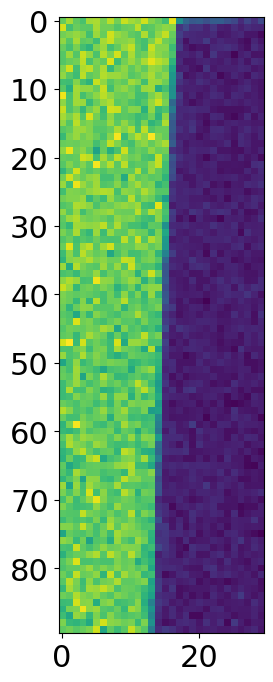

In [126]:
g1c=g1[570:660,790:820]
plt.imshow(g1c)


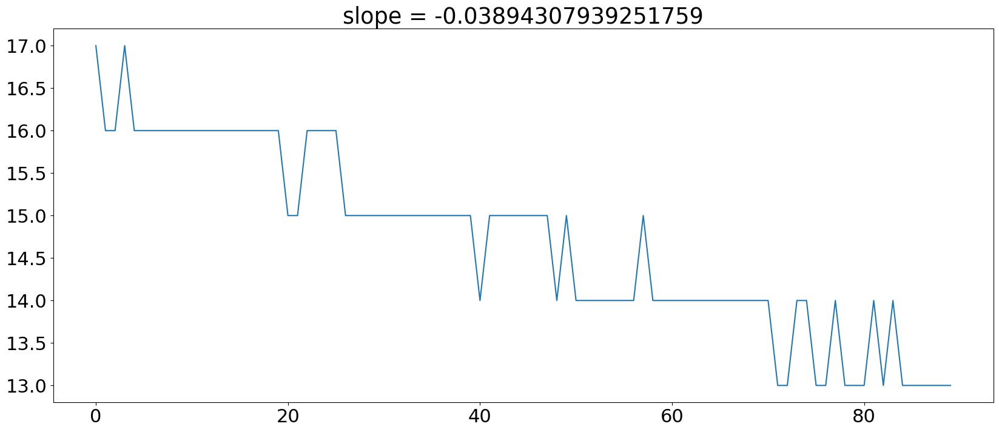

In [127]:
y=np.argmin(np.gradient(g1c, axis=1),axis=1)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope

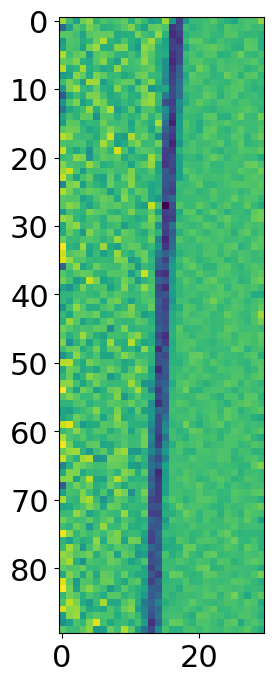

In [128]:
plt.imshow(np.gradient(g1c, axis=1))

In [129]:
points=np.zeros((np.size(g1c),2))
for pop in np.arange(g1c.shape[1]):
  for pip in np.arange(g1c.shape[0]):
    points[pop*g1c.shape[0]+pip,:]=(pop-slope*pip,g1c[pip,pop])
points=points[points[:,0].argsort(),:]

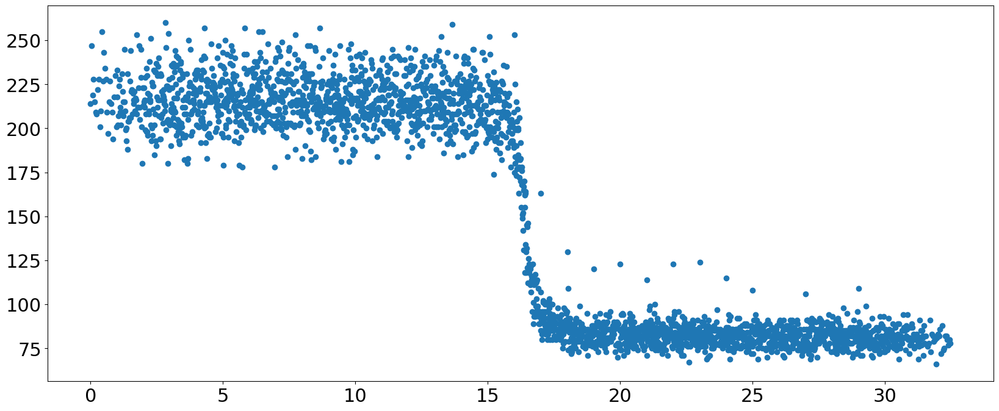

In [148]:
plt.scatter(points[:,0],points[:,1])